# Assignment2_4

In [12]:
import cv2, os, random
import matplotlib.pyplot as plt

In [13]:
script_dir = os.getcwd() # os.path.dirname(os.path.abspath(__file__)) # Get the directory of the current script
script_dir

'c:\\Users\\JonathanChackoPattas\\OneDrive - Maritime Support Solutions\\Desktop\\Class Notes\\Seneca\\Semester 2\\AIG210 - Computer Vision\\Assignment 2 - Group 5'

In [14]:
def ipynb_cv_imshow(title, img):
    """
    Display an image in a Jupyter Notebook cell.
    """
    if img is None:
        print("Image not found or could not be read.")
        return
    plt.figure(figsize=(10, 10))
    plt.title(title)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

## 1-	Open a color image and display

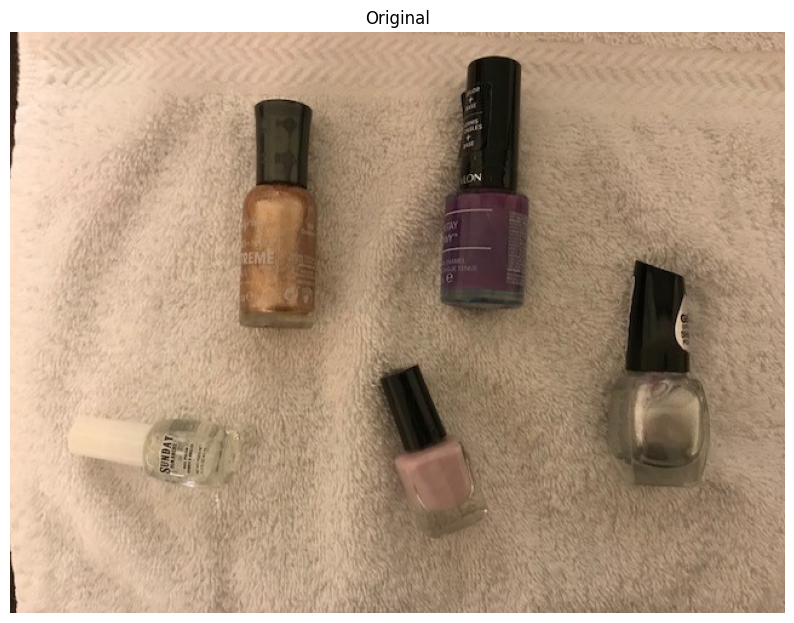

In [15]:
image_path = os.path.join(script_dir, 'nail_polish.jpg')
image = cv2.imread(image_path)
# cv2.imshow("Original", image)
ipynb_cv_imshow("Original", image)

### 2-	Ask the user for a probability value between 0 and 1 and implement the ‘Salt & Pepper Noise’ with the given probability. 
#### To create this noise, note that:
- The noisy image is the same as image except at affected pixels.
- The number of pixels affected by noise is p×width×height of image.
- The location of each affected pixel (row and column) is random within possible row and column values.
- The color of the noise is either black or white.

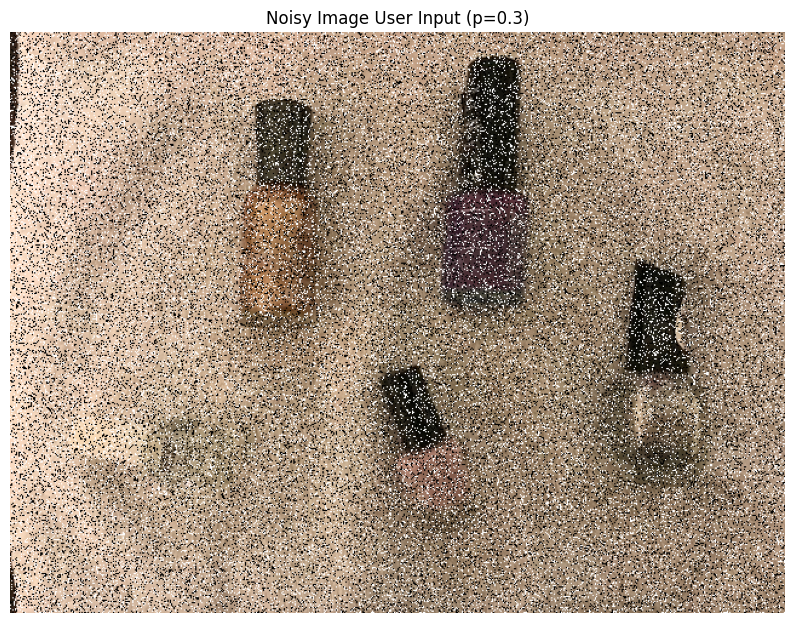

Noise added to the image with probability: 0.3


In [16]:
def apply_salt_pepper_noise(image, prob):
    noisy = image.copy()
    total_pixels = int(prob * image.shape[0] * image.shape[1])
    for _ in range(total_pixels):
        i = random.randint(0, image.shape[0] - 1)
        j = random.randint(0, image.shape[1] - 1)
        if random.random() < 0.5:
            noisy[i, j] = [0, 0, 0]  # pepper (black)
        else:
            noisy[i, j] = [255, 255, 255]  # salt (white)
    return noisy
user_input = float(input("Enter the noise probability (0.0 to 1.0): "))
noisy = apply_salt_pepper_noise(image, user_input)
# cv2.imwrite("noisy.jpg", noisy)
ipynb_cv_imshow(f"Noisy Image User Input (p={user_input})", noisy)
print("Noise added to the image with probability:", user_input)

### 3-	Create two noisy images with p = 0.10 and p = 0.20. 


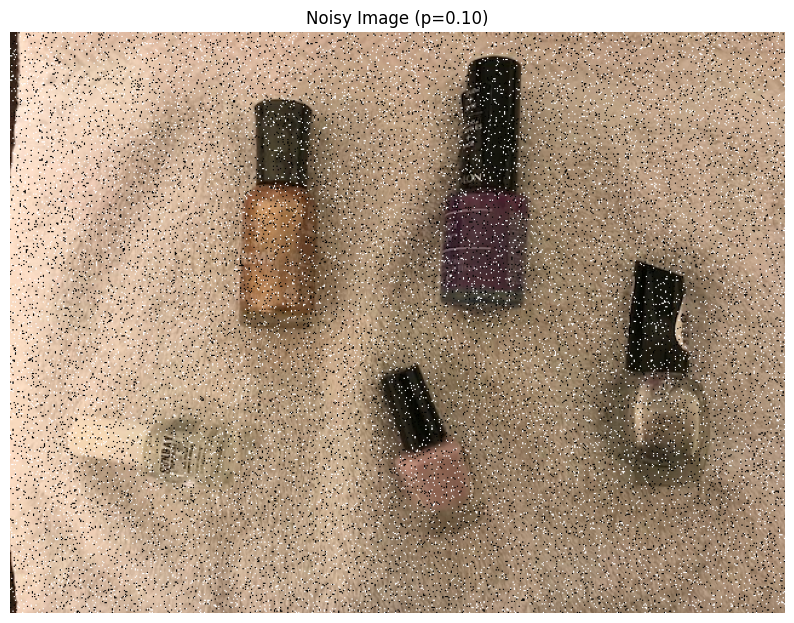

In [17]:
noisy_10 = apply_salt_pepper_noise(image, 0.10)
# cv2.imwrite("noisy_10.jpg", noisy_10)
ipynb_cv_imshow("Noisy Image (p=0.10)", noisy_10)

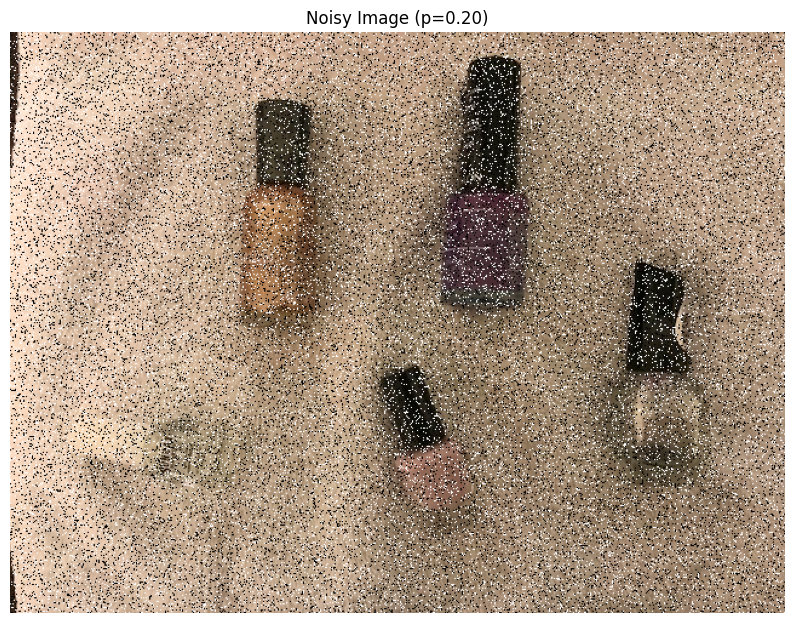

In [18]:
noisy_20 = apply_salt_pepper_noise(image, 0.20)
# cv2.imwrite("noisy_20.jpg", noisy_20)
ipynb_cv_imshow("Noisy Image (p=0.20)", noisy_20)

## For the following steps, use separable filters where applicable to denoise the noisy images.

### 4-	Apply a 3×3 Box Filter.

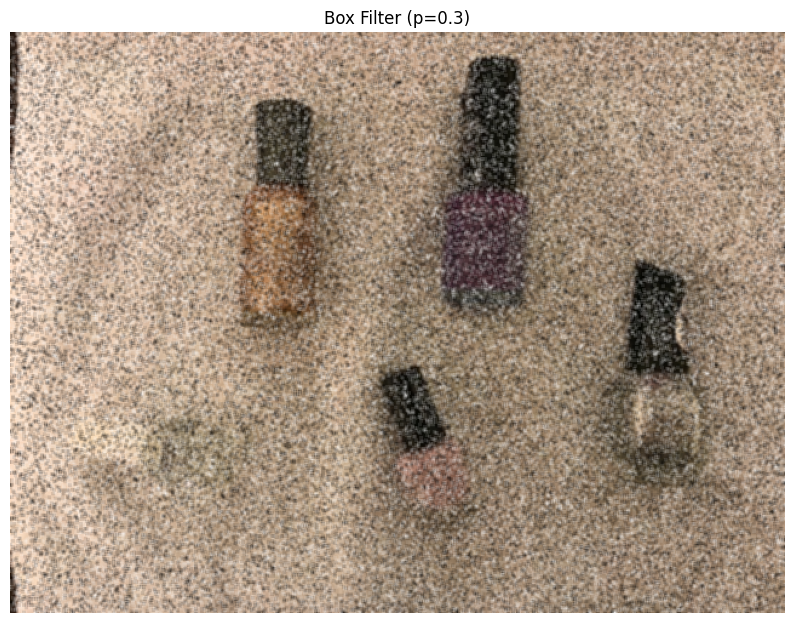

In [19]:
box = cv2.blur(noisy, (3, 3))
# cv2.imwrite("box.jpg", box)
ipynb_cv_imshow(f"Box Filter (p={user_input})", box)

### 5-	Apply a 3×3 Median Filter.

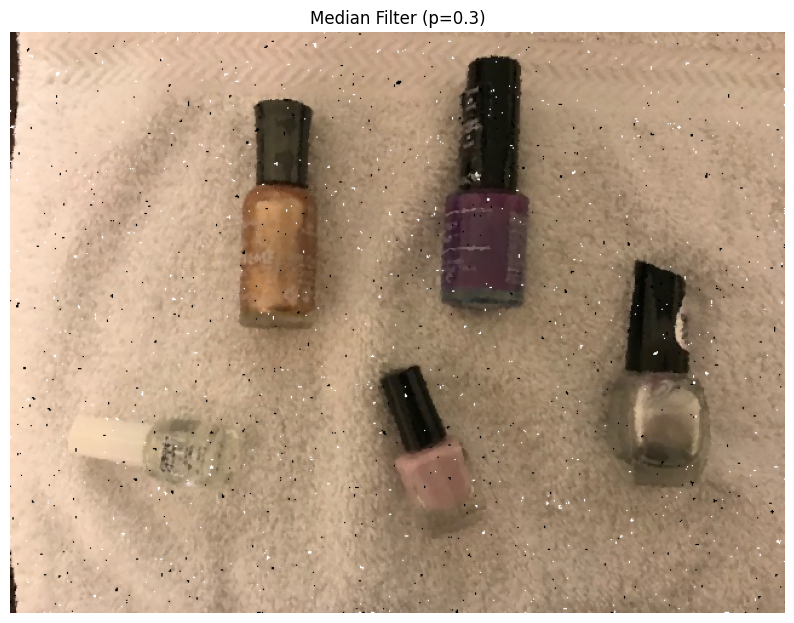

In [20]:
median = cv2.medianBlur(noisy, 3)
# cv2.imwrite("median.jpg", median)
ipynb_cv_imshow(f"Median Filter (p={user_input})", median)

### 6-	Apply a 3×3 Bilinear Filter.

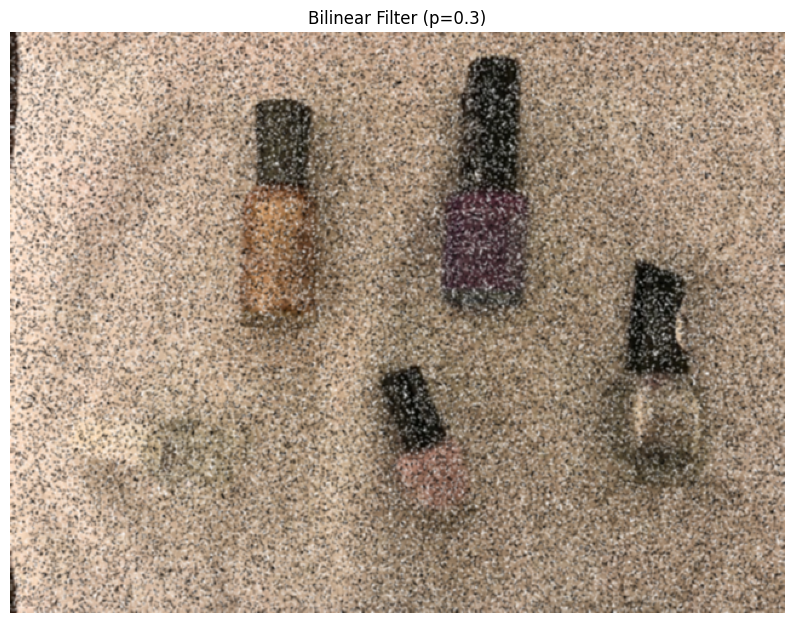

In [24]:
bilinear = cv2.GaussianBlur(noisy, (3, 3), sigmaX=0)
# cv2.imwrite("bilinear.jpg", bilinear)
ipynb_cv_imshow(f"Bilinear Filter (p={user_input})", bilinear)

### 8-	Try different kernel sizes for Box and Median Filters, for example, 11×11 and 25×25. Explain how the kernel size affects the results. If helpful, include sample outputs with your explanation.

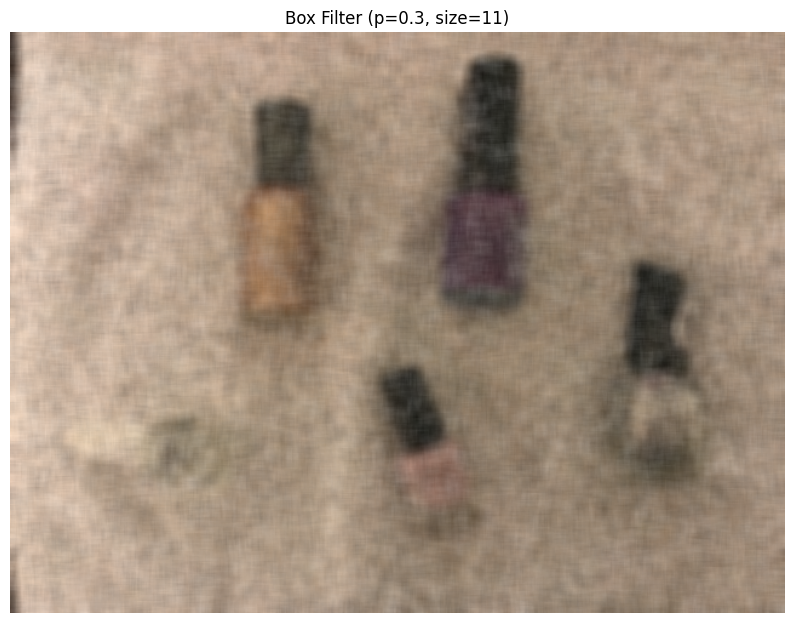

In [ ]:
box_11 = cv2.blur(noisy, (11, 11))
# cv2.imwrite("box_11.jpg", box_11)
ipynb_cv_imshow(f"Box Filter (p={user_input}, size=11)", box_11)

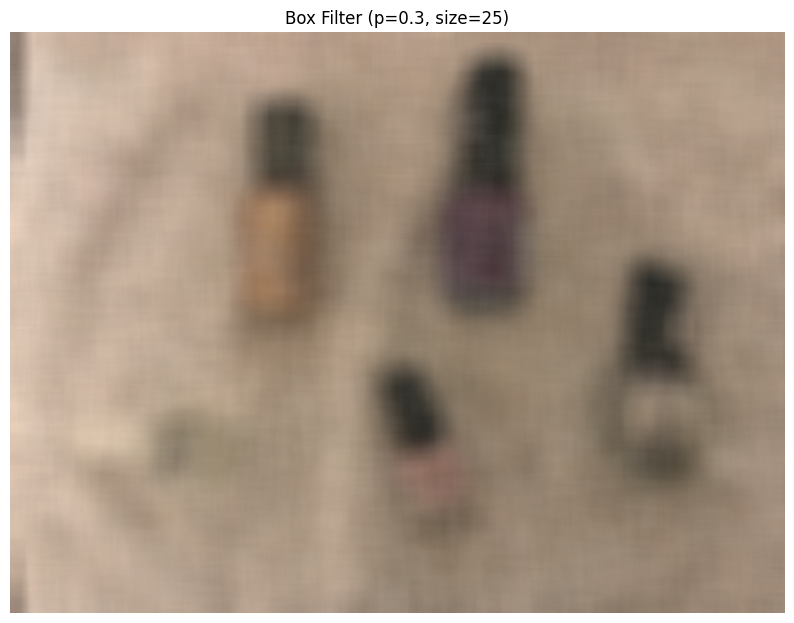

In [ ]:
box_25 = cv2.blur(noisy, (25, 25))
# cv2.imwrite("box_25.jpg", box_25)
ipynb_cv_imshow(f"Box Filter (p={user_input}, size=25)", box_25)

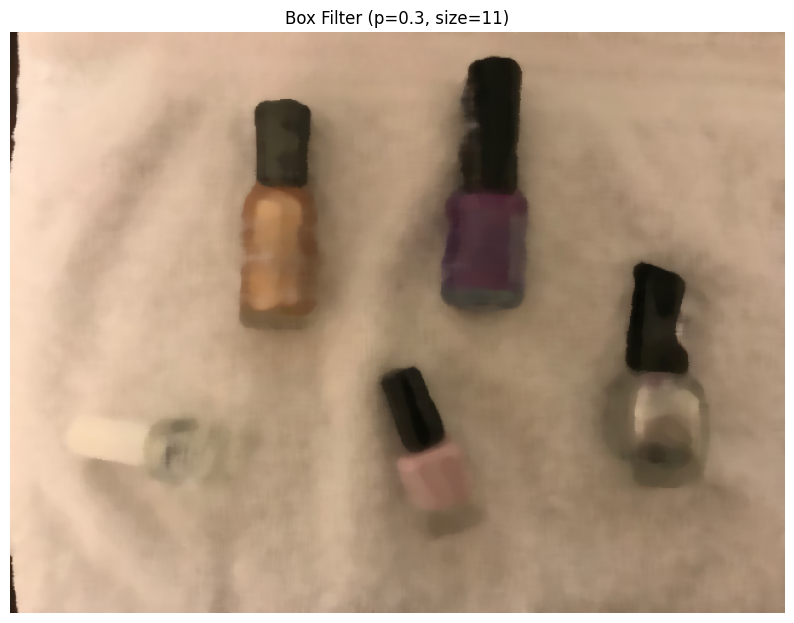

In [ ]:
median_11 = cv2.medianBlur(noisy, 11)\
# cv2.imwrite("median_11.jpg", median_11)
ipynb_cv_imshow(f"Box Filter (p={user_input}, size=11)", median_11)

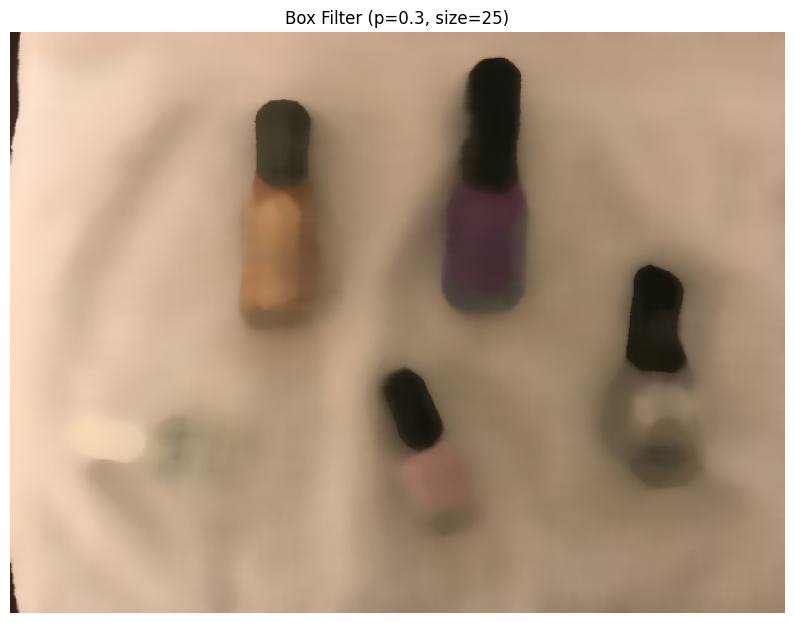

In [ ]:
median_25 = cv2.medianBlur(noisy, 25)
# cv2.imwrite("median_25.jpg", median_25)
ipynb_cv_imshow(f"Box Filter (p={user_input}, size=25)", median_25)